<a href="https://colab.research.google.com/github/alanrolemberg/mvp-engenharia-dados/blob/main/EngenhariaDeDados_MVP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pontifícia Universidade Católica do Rio de Janeiro - PUC - RJ
**Ano:** 2023

**Sprint:** Engenharia de dados (40530010057_20230_01)

**MVP – Minimun Valuable Product**

**Aluno:** ALAN ROLEMBERG ELIODORIO

## 0. Objetivo do trabalho

O comércio eletrônico vem crescendo a cada ano no mundo, e é um dos principais casos de uso para análise de dados, tanto no quesito de análise histórica em DWs como no quesito de análise preditiva, através de algoritmos de machine Learning.
Portanto, neste trabalho iremos realizar a busca por uma base de dados de vendas via comércio eletrônico, buscando efetuar análises e responder as perguntas abaixo:
- Qual o incremento de vendas de produtos de um ano para o outro?
- Quais os produtos que mais venderam nos últimos anos?
- Quais as três categorias de produtos que mais venderam nos últimos anos?
- Quais os métodos de pagamentos mais usados por consumidores jovens(<30)? E quais os métodos de pagamentos mais usados por consumidores idosos (>65)? E quais os métodos de pagamentos mais usados pelos consumidores em geral?
- Qual o índice de satisfação médio do consumidor do Nordeste do Brasil? E qual o índice de satisfação médio do consumidor do Sul do Brasil? E qual o índice GERAL de todos os consumidores?

## 1. Busca pelos dados

A base de dados escolhida foi a Brazilian E-Commerce Public Dataset extraída do Kaggle. Este banco de dados foi disponibilizado pela olist.com, que é uma empresa que comercializa “sites para comércio eletrônico”.
URL: https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce?resource=download
O dataset traz um conjunto de dados apenas entre 2016 e 2018, mas parece ser o suficiente para rodar análises de dados relevantes sobre o tema de comércio eletrônico.

## 2 . Coleta

Conseguimos resgatar um conjunto de 9 arquivos conforme imagem abaixo:

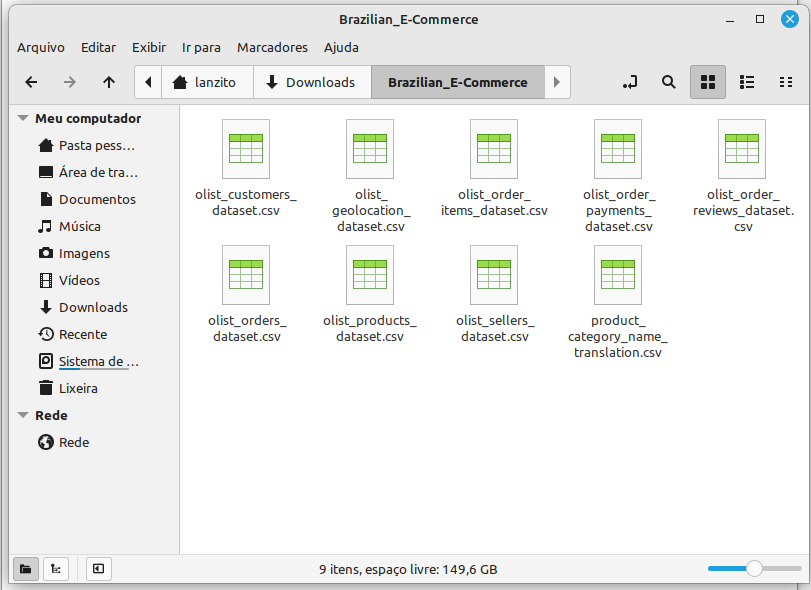

Esses arquivos representam tabelas normalizadas que contêm as entidades abaixo:

    • Orders (Vendas)
    • Order Items (Itens vendidos)
    • Products (Produtos)
    • Customers (Clientes)
    • Sellers (Vendedores)
    • Payments (Pagamento de pedidos)
    • Reviews (Avaliação de pedidos)
    • Category_Name_translation (Tradução do nome da categoria)
    • Geolocation (Geolocalização)

Esses arquivos serão coletados no Kaggle, carregados no Azure Blob Storage, e a partir dele serão efetuadas transformações para que esta base constitua um Datawarehouse baseado em um banco de dados relacional Postgre (abordagem ROLAP - Relational OLAP).

O primeiro passo que executamos foi o carregamento dos arquivos no Azure Blob Storage, para fins de uso dentro dos recursos da nuvem Azure.





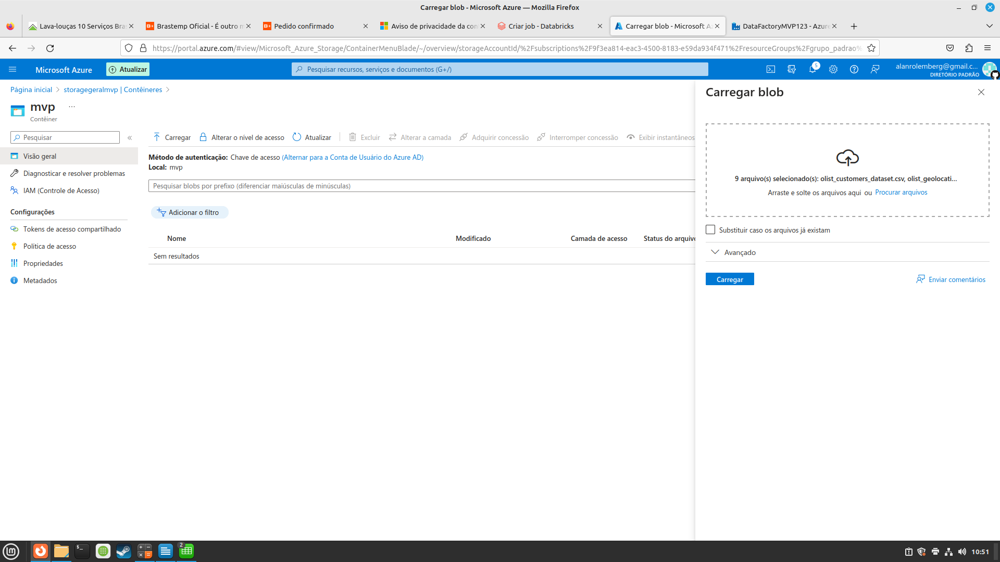

Após os carregamentos sucessivos obtivemos os resultados abaixo:

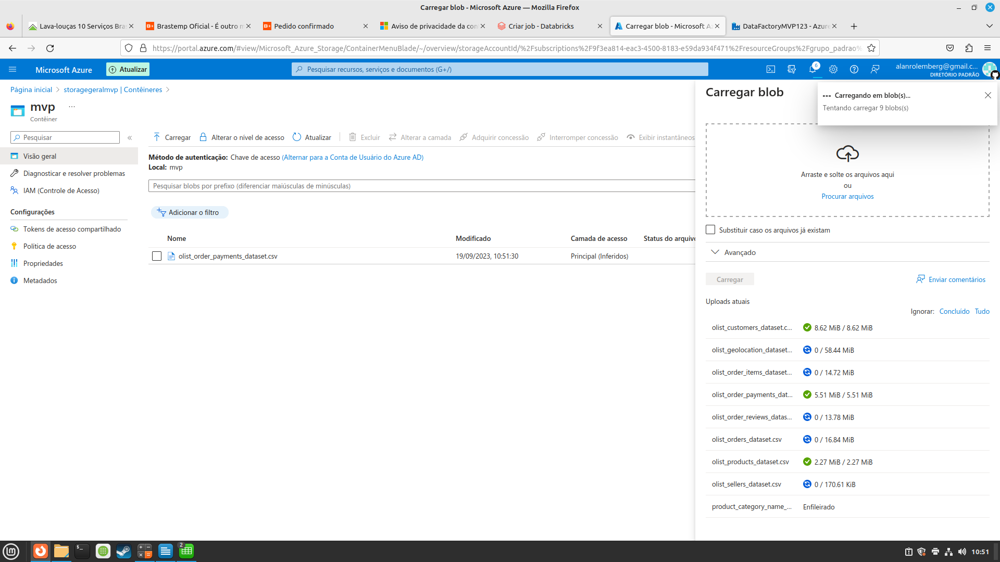

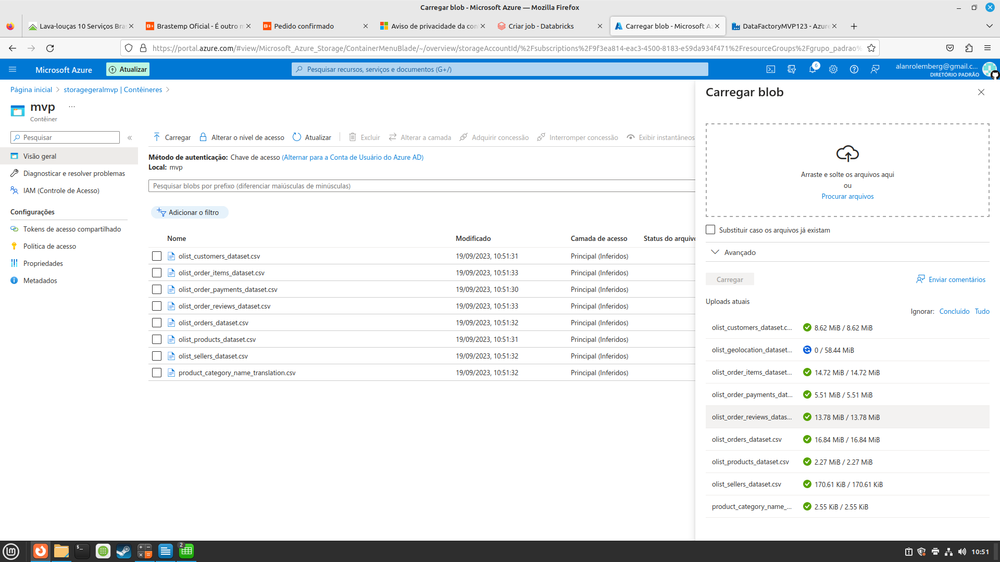

Ao final do processo de carga, temos os nossos dados disponibilizados em ambiente de nuvem. O objetivo é usar esses datasets como base para geração do modelo de datawarehouse pretendido.

## 3 . Modelagem

**> 3.1 Elaboração do Modelo**

> Idealizamos uma modelagem alvo para representar o datawarehouse que precisamos para responder nossas perguntas. O formato escolhido foi star schema, no qual teremos apenas uma tabela fato, que terá os dados das vendas (orders) que iremos analisar. Esse modelo foi elaborado através da ferramenta genmymodel.com .
Abaixo está a imagem do modelo que desenhamos:


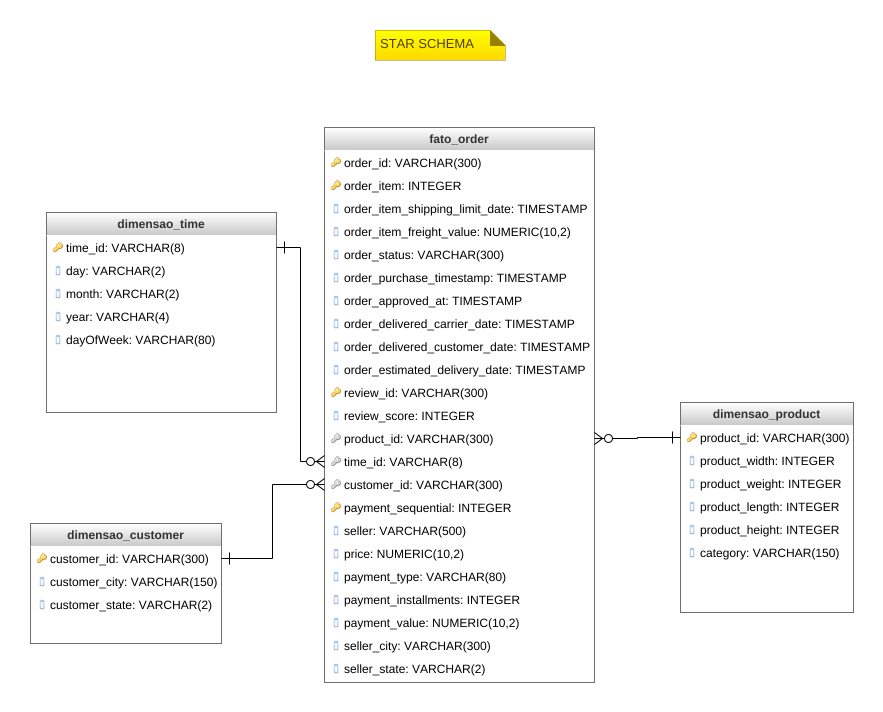


Podemos notar que a tabela fato é uma união desnormalizada das tabelas *order*, *order_items*, *payments* e *sellers*. As tabelas *products* e *customer* constituem dimensões, e a tabela time será gerada para servir como dimensão tempo do nosso datawarehouse.

Após a geração desse modelo, utilizamos o gerador de códigos do GenMyModel.com para gerar o script de banco de dados, que foi disparado via Azure Data Studio:

In [ ]:
CREATE TABLE IF NOT EXISTS fato_order
(
    order_id VARCHAR(300) NOT NULL,
    order_item INTEGER NOT NULL,
    order_item_shipping_limit_date TIMESTAMP,
    order_item_freight_value NUMERIC(10, 2),
    order_status VARCHAR(300),
    order_purchase_timestamp TIMESTAMP,
    order_approved_at TIMESTAMP,
    order_delivered_carrier_date TIMESTAMP,
    order_delivered_customer_date TIMESTAMP,
    order_estimated_delivery_date TIMESTAMP,
    review_id VARCHAR(300) NOT NULL,
    review_score INTEGER,
    product_id VARCHAR(300),
    time_id VARCHAR(8),
    customer_id VARCHAR(300),
    payment_sequential INTEGER NOT NULL,
    seller VARCHAR(500),
    price NUMERIC(10, 2),
    payment_type VARCHAR(80),
    payment_installments INTEGER,
    payment_value NUMERIC(10, 2),
    seller_city VARCHAR(300),
    seller_state VARCHAR(2),
    PRIMARY KEY(order_id, order_item, review_id, payment_sequential)
);

CREATE TABLE IF NOT EXISTS dimensao_time
(
    time_id VARCHAR(8) NOT NULL,
    day VARCHAR(2),
    month VARCHAR(2),
    year VARCHAR(4),
    dayOfWeek VARCHAR(80),
    PRIMARY KEY(time_id)
);

-- <p>Dimens&atilde;o que agrupa as entidades items, products e seller de forma desnormalizada.</p>
--
CREATE TABLE IF NOT EXISTS dimensao_product
(
    product_id VARCHAR(300) NOT NULL,
    product_width INTEGER,
    product_weight INTEGER,
    product_length INTEGER,
    product_height INTEGER,
    category VARCHAR(150),
    PRIMARY KEY(product_id)
);

CREATE TABLE IF NOT EXISTS dimensao_customer
(
    customer_id VARCHAR(300) NOT NULL,
    customer_city VARCHAR(150),
    customer_state VARCHAR(2),
    PRIMARY KEY(customer_id)
);


-- Create FKs
ALTER TABLE fato_order
    ADD    FOREIGN KEY (product_id)
    REFERENCES dimensao_product(product_id)
    MATCH SIMPLE
;

ALTER TABLE fato_order
    ADD    FOREIGN KEY (customer_id)
    REFERENCES dimensao_customer(customer_id)
    MATCH SIMPLE
;

ALTER TABLE fato_order
    ADD    FOREIGN KEY (time_id)
    REFERENCES dimensao_time(time_id)
    MATCH SIMPLE
;


**> 3.2 Catálogo de dados**

Inicialmente tínhamos como objetivo criar todos os recursos na nuvem Azure. Porém, o produto da Azure (Data Catalog) só está disponível para contas de Estudante e Empresarial. Como minha conta é pessoal, e demoraria algum tempo até a Microsoft avaliar minha documentação de estudante, decidi fazer apenas as partes de catálogo de dados / qualidade de dados através da nuvem do Google.

Vamos necessitar então criar um Bucket no Google Cloud Storage, e enviar os arquivos para lá com os dados:

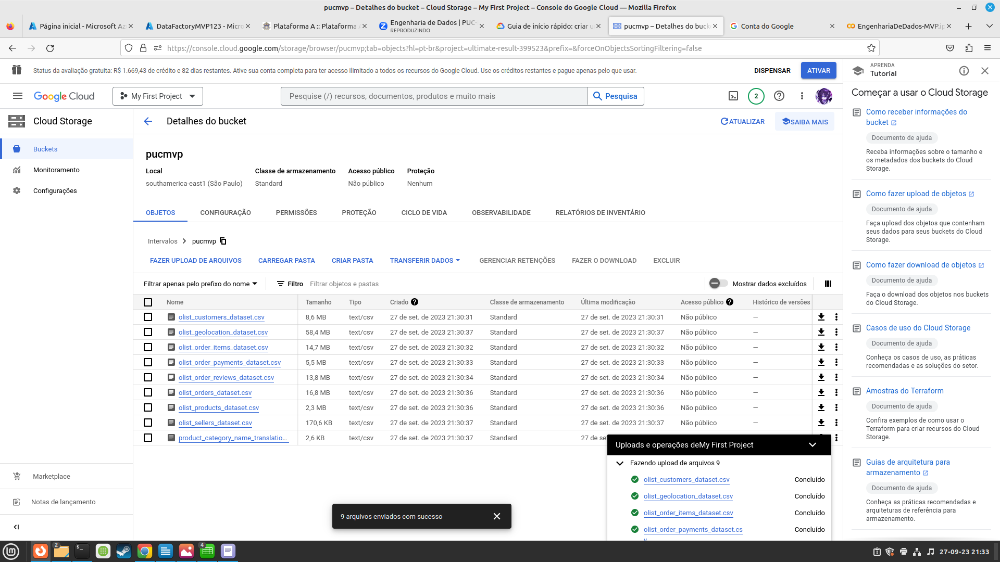

**3.2.1 Dataproc**

O próximo passo foi ativar o Dataproc. Criamos um serviço de metastore do Dataproc, e a partir daí ficamos habilitados a usar o Google Dataplex.



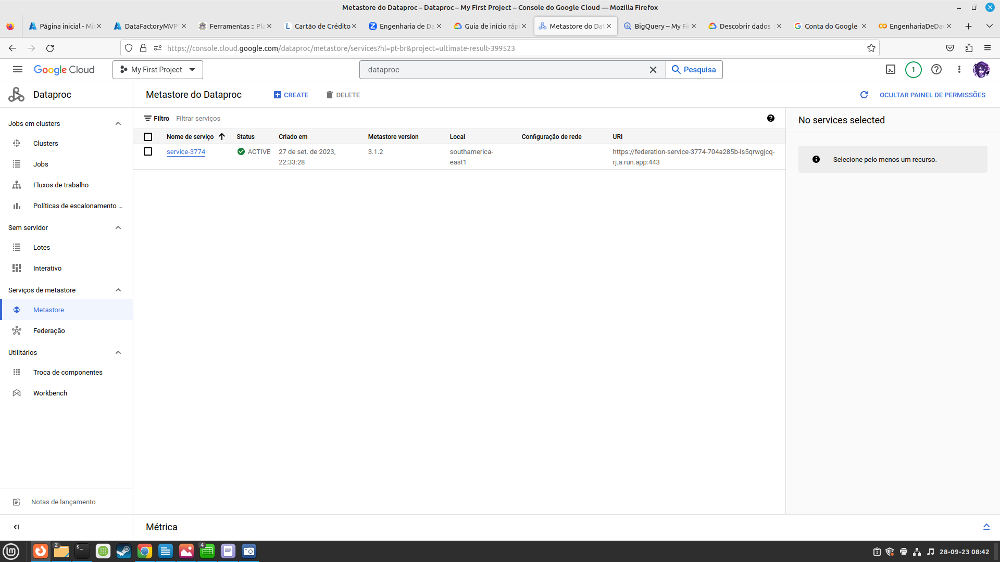

**3.2.2 Converter arquivos em tabelas do BigQuery**

Neste ponto, foi necessário pegar cada um dos arquivos e criar tabelas correspondentes do Big Query. A detecção automática de esquema foi utilizada para coletar os nomes de colunas (através do cabeçalho) e o tipo de dados contido em cada uma das colunas. Apenas a tabela "reviews" nos trouxe problemas de importação, porém estes problemas foram contornados através das opções avançadas, onde há uma opção que nos permite trabalhar com arquivos que contenham quebra de linha no meio da linha.

A nomenclatura padrão utilizada para as tabelas no Big Query foi "BQ_[dataset_name]" para não confundir com os conjuntos de dados originais.

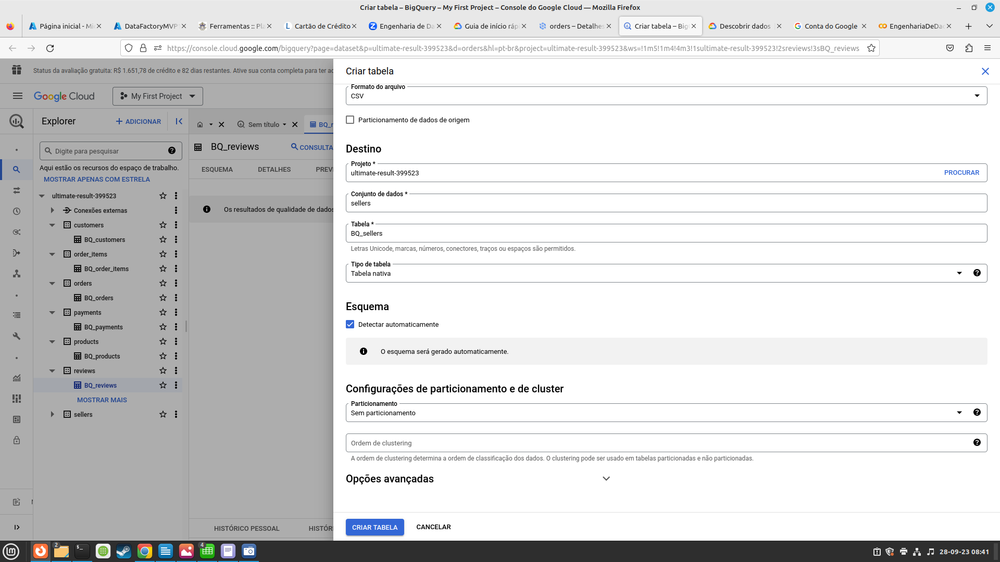

**3.2.3 Alimentar o catálogo de dados (Google BigQuery e Dataplex)**

No BigQuery é possível catalogar algumas informações, como o Descritivo dos campos, no qual preenchemos o significado do conteúdo daquele campo. Uma outra informação catalogável é o "Default value" daquele campo.

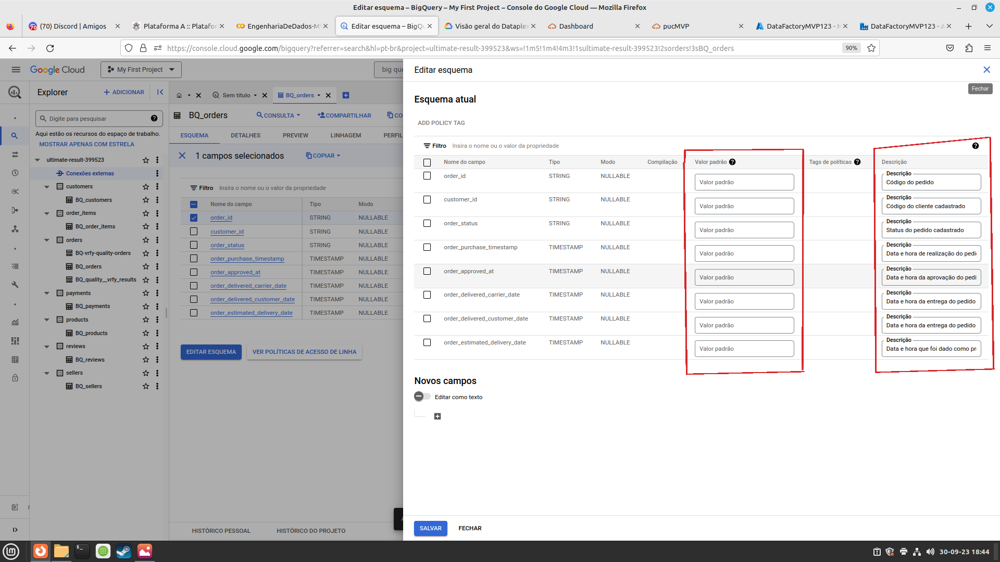

Já do Dataplex, tarefas mais complexas são possíveis:
- criar taxonomias para agrupar os atributos;
- criar modelos de conjuntos de atributos (modelo de tags);
- criar grupos de entrada para controlar o acesso a arquivos;
- criar glossários.

No nosso exemplo abaixo da tabela "order", criamos um modelo de tageamento baseado nos campos originais que serve como base para geração/validação de novas tabelas que precisem usar este mesmo modelo.

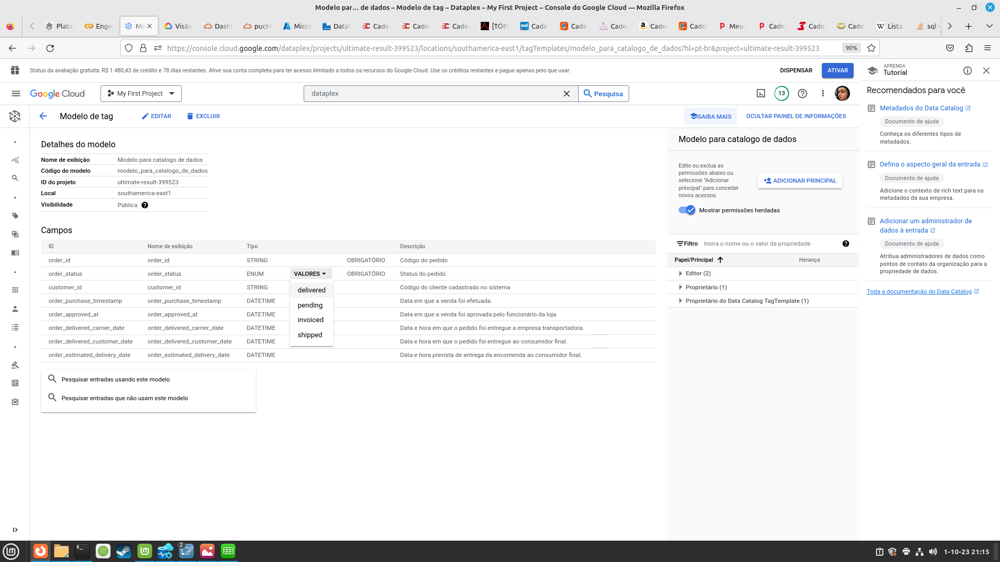

**Glossário:** Aqui geramos uma glossário com alguns termos que poderia se aplicar ao nosso negócio de vendas, como "pagamento no boleto", "pagamento no cartão", "pedido pago" e "pedido pendente".

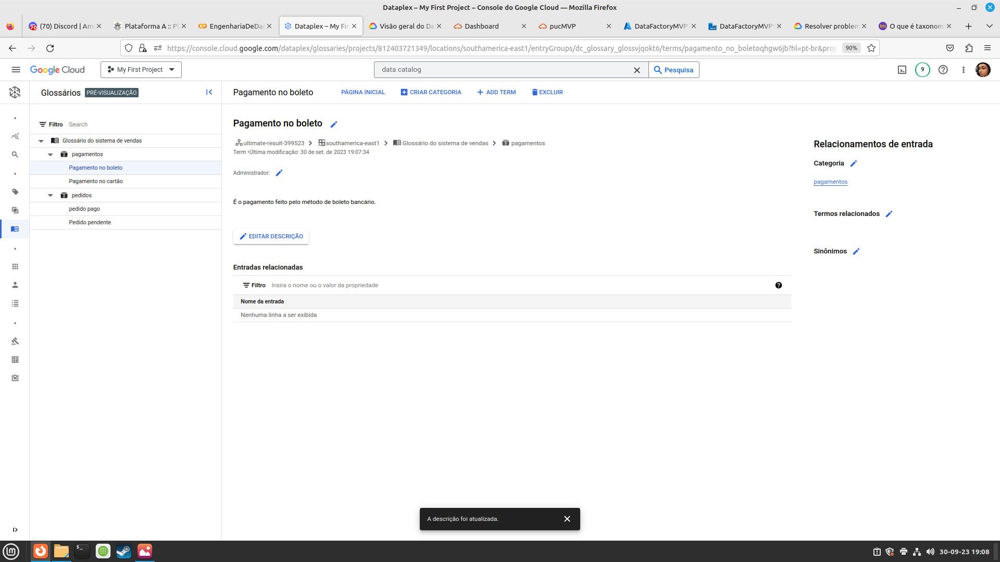

Não avançaremos no uso do dataplex devido a não ser necessário para a finalidade deste trabalho.




**> 3.3 Domínio dos dados**

Nesta seção iremos analisar o domínio dos campos do modelo. Nesta listagem não levaremos em consideração os campos chave, campos de ID, campos de medição e campos de data por terem pouca/nenhuma relevância na análise de domínio.

> Como consultar o domínio de dados via query? (select [field] from public.[table] group by [field])

> **Tabela fato_order:**
* order_status: **[approved, canceled, delivered, invoiced, processing, shipped, unavailable]**
* review_score: 1 a 5
* price: 0 a 9.999.999,99
* payment_type: **[boleto, credit_card, debit_card, voucher]**
* payment_installments: 1 a 24
* payment_value: 0 a 9.999.999,99
* seller_city: 611 nomes de cidades do brasil (não citaremos por ser uma lista extensiva)
* seller_state: [AC, AL, AP, AM, BA, CE, ES, GO, MA, MT, MS, MG, PA, PB, PR, PE, PI, RJ, RN, RS, RO, RR, SC, SP, SE, TO, DF]

> **Tabela dimensao_time**
* day: 1 a 31
* month: 1 a 12
* year: 2016 a 2018
* dayOfWeek: 1 a 7

> **Tabela dimensao_customer**
* customer_city: 4119 nomes de cidades do Brasil (não citaremos por ser uma lista extensiva)
* customer_state: [AC, AL, AP, AM, BA, CE, ES, GO, MA, MT, MS, MG, PA, PB, PR, PE, PI, RJ, RN, RS, RO, RR, SC, SP, SE, TO, DF]

> **Tabela dimensao_product**
* category: [agro_industria_e_comercio, alimentos, alimentos_bebidas, artes, artes_e_artesanato, artigos_de_festas, artigos_de_natal, audio, automotivo, bebes, bebidas, beleza_saude, brinquedos, cama_mesa_banho, casa_conforto, casa_conforto_2, casa_construcao, cds_dvds_musicais, cine_foto, climatizacao, consoles_games, construcao_ferramentas_construcao, construcao_ferramentas_ferramentas, construcao_ferramentas_iluminacao, construcao_ferramentas_jardim, construcao_ferramentas_seguranca, cool_stuff, dvds_blu_ray, eletrodomesticos, eletrodomesticos_2, eletronicos, eletroportateis, esporte_lazer, fashion_bolsas_e_acessorios, fashion_calcados, fashion_esporte, fashion_roupa_feminina, fashion_roupa_infanto_juvenil, fashion_roupa_masculina, fashion_underwear_e_moda_praia, ferramentas_jardim, flores, fraldas_higiene, industria_comercio_e_negocios, informatica_acessorios, instrumentos_musicais, la_cuisine, livros_importados, livros_interesse_geral, livros_tecnicos, malas_acessorios, market_place, moveis_colchao_e_estofado, moveis_cozinha_area_de_servico_jantar_e_jardim, moveis_decoracao, moveis_escritorio, moveis_quarto, moveis_sala, musica, papelaria, pc_gamer, pcs, perfumaria, pet_shop, portateis_casa_forno_e_cafe, portateis_cozinha_e_preparadores_de_alimentos, relogios_presentes, seguros_e_servicos, sinalizacao_e_seguranca, tablets_impressao_imagem, telefonia, telefonia_fixa, utilidades_domesticas]




## 4. Carga



Na etapa de carga, usamos novamente o ambiente da Azure, através do DataFactory.

Dividimos a carga em 4 etapas, sendo 3 para as tabelas de dimensão, pois elas precisam ser carregadas primeiro, e ao final é feita a carga da tabela fato. Essas cargas já envolvem o processo de ETL, no qual são executadas as transformações nos modelos de dados, para que deixem de representar um modelo flat e passem a representar um modelo de datawarehouse.



> **4.1 Carga da Dimensão Time**

O campo chave da dimensão time foi obtido a partir de uma derivação do campo order_purchase_timestamp, contido na tabela fato. Extraímos dele as datas sem a porção de horas, e verificamos o range total de possibilidades do campo (domínio atual). A partir desta informação populamos o campo time_id. A partir do time_id, derivamos também os campos "day", "month", "year" e "dayOfWeek". Dessa forma, criamos uma dimensão de tempo na tabela **dimensao_time** que contém apenas o mínimo de informação necessária para conseguirmos realizar nossas consultas através de "joins" com a tabela fato.



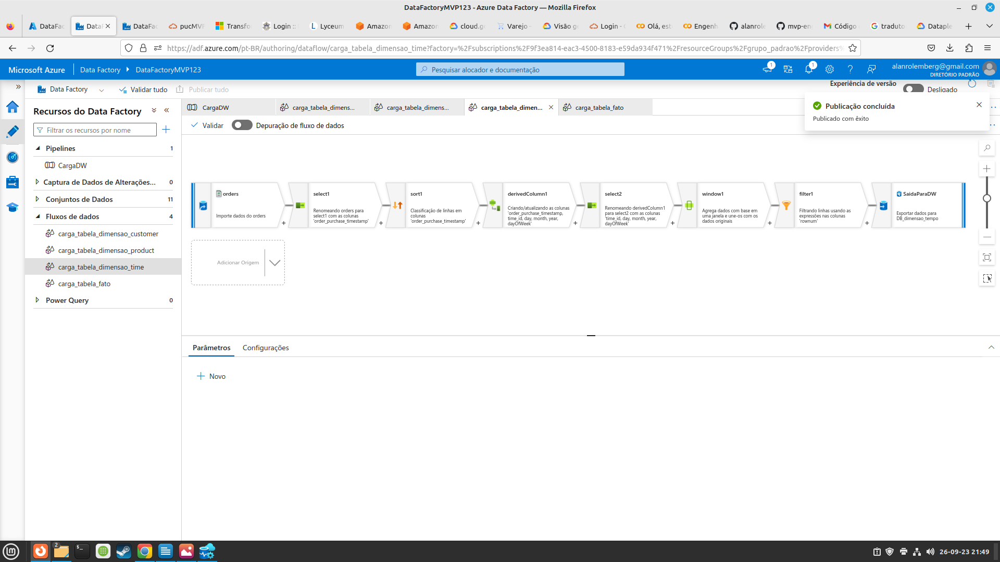

> **4.2 Carga da Dimensão Product**

A dimensão product contém um subconjunto de dados que foram verificados como úteis para o nosso Datawarehouse. Fizemos então uma seleção destes campos e carregamos da tabela **dimensao_product**.

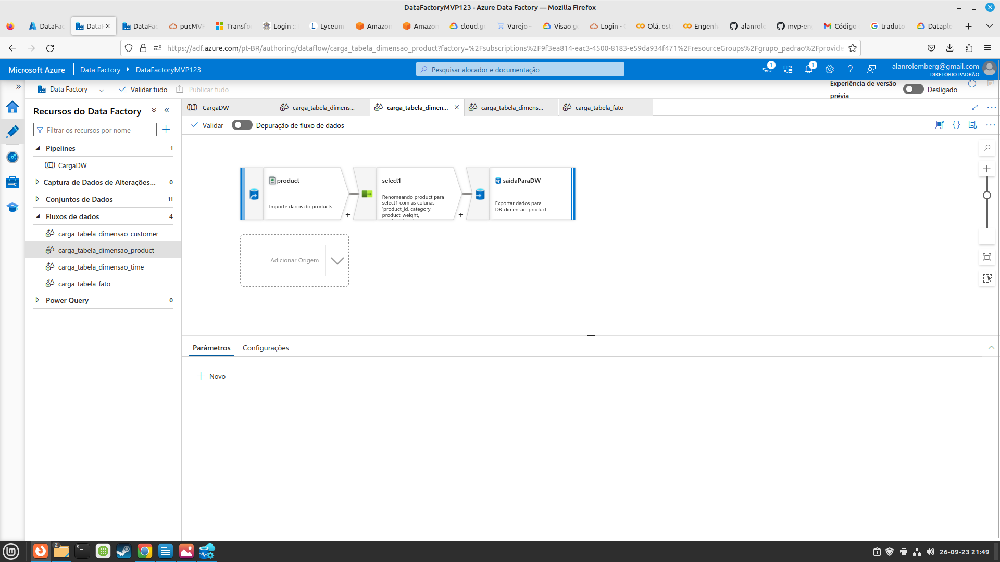

> **4.3 Carga da Dimensão Customer**

A dimensão customer não exigiu nenhum componente de filtro de linhas ou seleção de colunas. Importamos a informação integral contida no arquivo original, e a carregamos na tabela **dimensao_customer**.

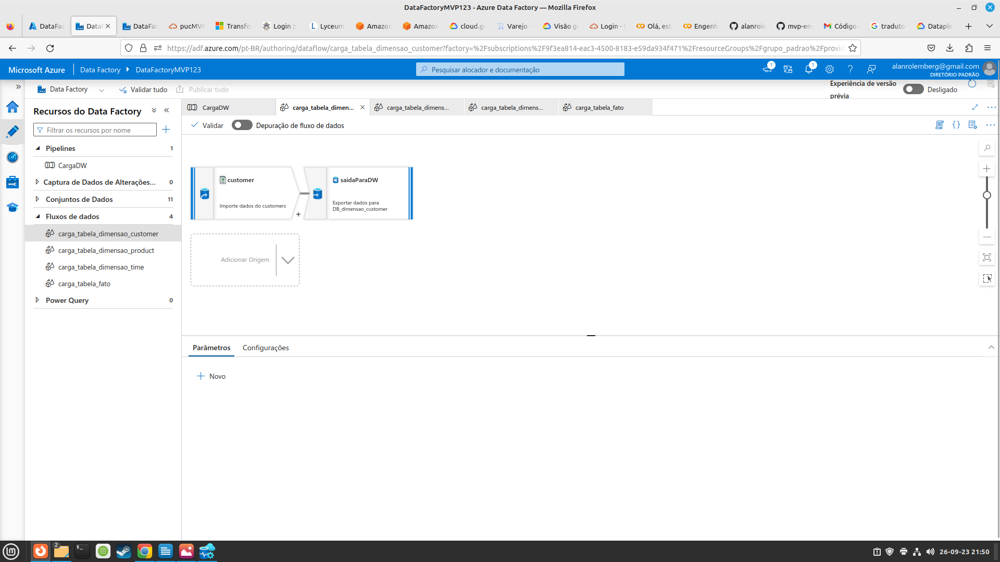

> **4.4 Carga da tabela fato**

A tabela fato foi a mais trabalhosa para ser obtida. Devido as restrições de integridade com as tabelas de dimensão, ela precisa ser a última a ser carregada. Fizemos uma seleção inicial de dados na tabela "orders", fazendo então joins sucessivos com as tabelas "review", "seller" e "payments" de forma a obter uma tabela desnormalizada contendo os dados relevantes destas 4 tabelas. Criamos então uma coluna extra, timeid, derivada da coluna order_purchase_timestamp (igual ao que fizemos na dimensão de tempo) para conseguirmos fazer o join baseado em tempo.

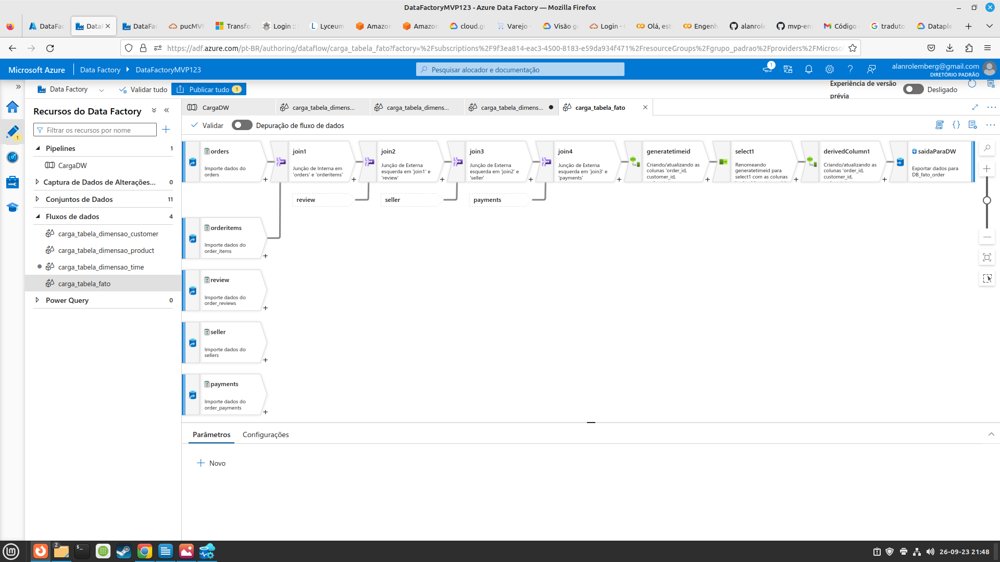

> **4.5 Montagem do Pipeline**

Como passo final, encadeados as cargas dentro de um pipeline, que denominamos de "CargaDW", e disparamos um gatilho para promover a carga dos dados em nosso Datawarehouse.

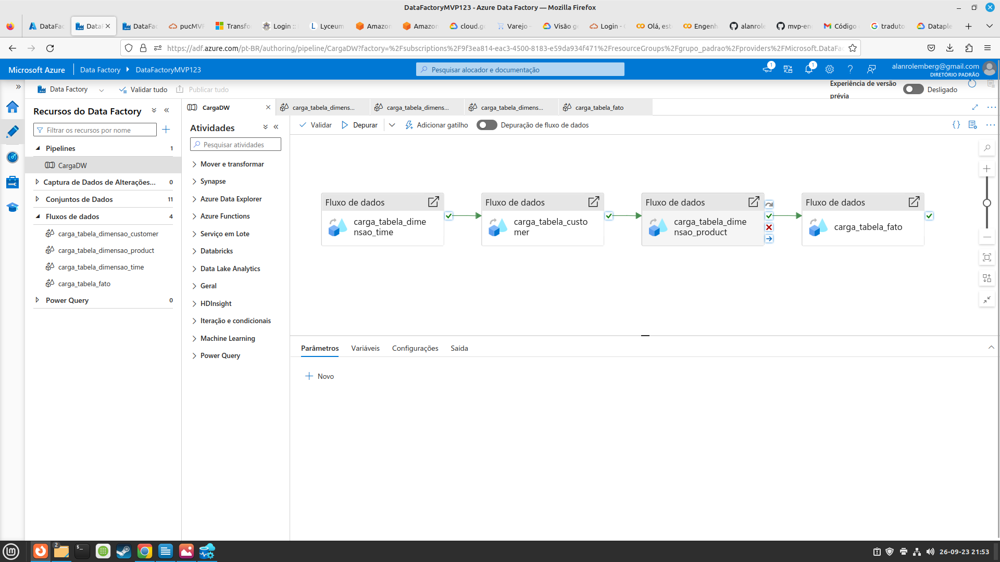

> **4.6 Resultado final das cargas (Execução do Pipeline):**

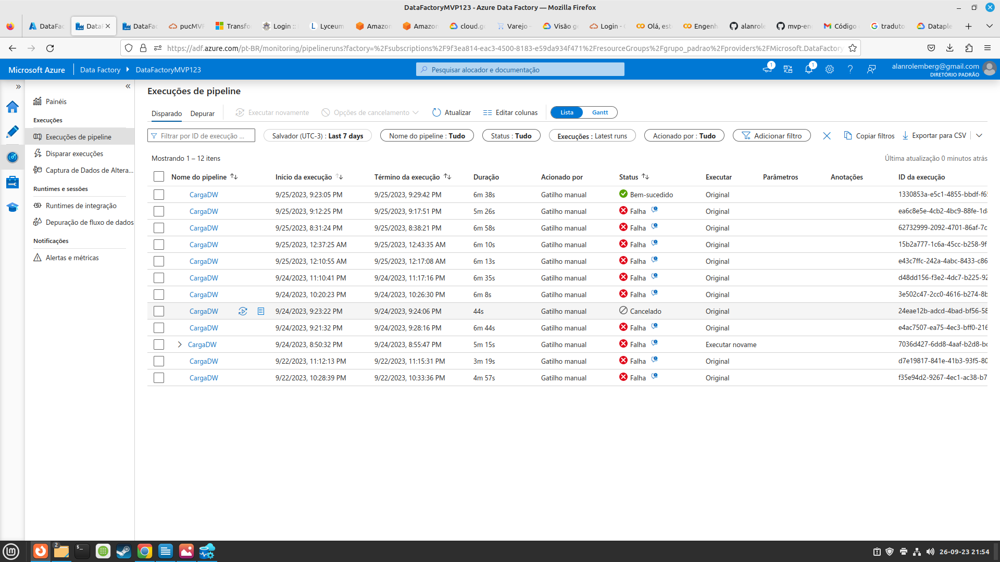

Após algumas várias execuções mal sucedidas, e vários tratamentos de dados sendo realizados, conseguimos efetuar uma carga bem sucedida e sem erro de restrições de integridade. Na imagem abaixo vemos que agora temos as 4 tabelas em formato de Datawarehouse, seguindo o star schema. Agora estamos prontos para executar nossas consultas no datawarehouse visando tentar encontrar respostas para as nossas perguntas.

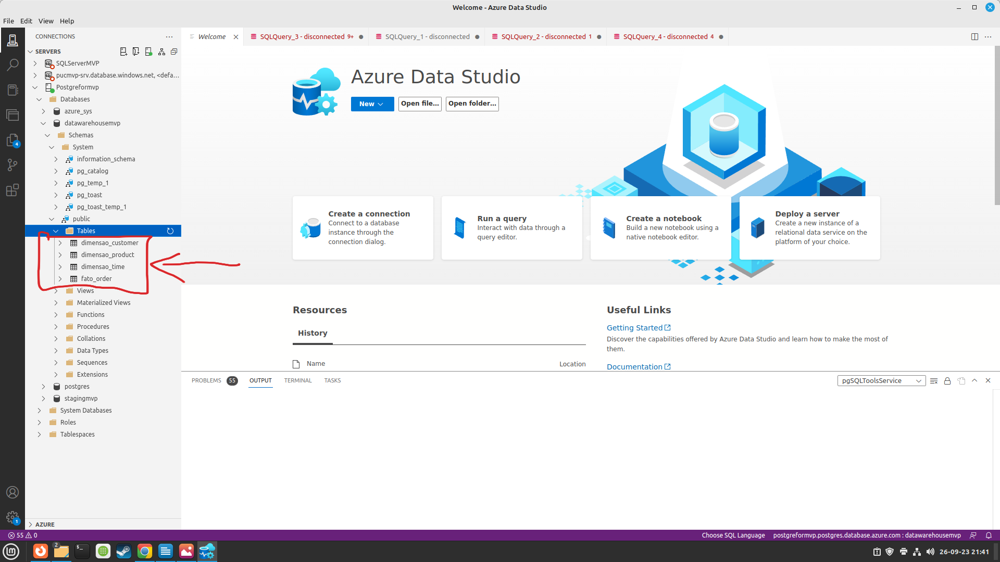

## 5. Análise



**5.1 Qualidade de dados**

Inicialmente tínhamos como objetivo criar todos os recursos na nuvem Azure. Porém, o produto da Azure (Data Catalog) só está disponível para contas de Estudante e Empresarial. Como minha conta é pessoal, e demoraria algum tempo até a Microsoft avaliar minha documentação de estudante, decidimos fazer apenas as partes de catálogo de dados / qualidade de dados através da nuvem do Google.

Isso significa que usaremos o Google BigQuery e o Dataplex para fazer as análises de qualidade deste trabalho.


**5.1.2 Criação de Perfil**

Para uma verificação de qualidade automatizada, é necessário primeiro criar um perfil de dados. Criamos o perfil de dados para a tabela BQ_orders. O nome o perfil foi "Verify-table-orders".

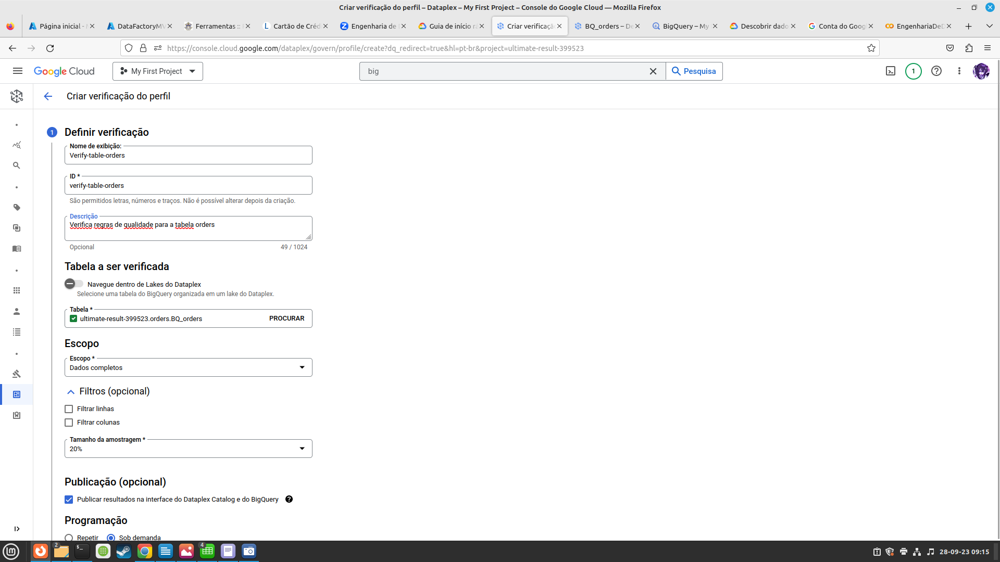

O perfil exige a criação de uma tabela no Big Query especifíca para armazenar os dados do perfil. É através deste perfil que conseguiremos realizar as análises de qualidade.

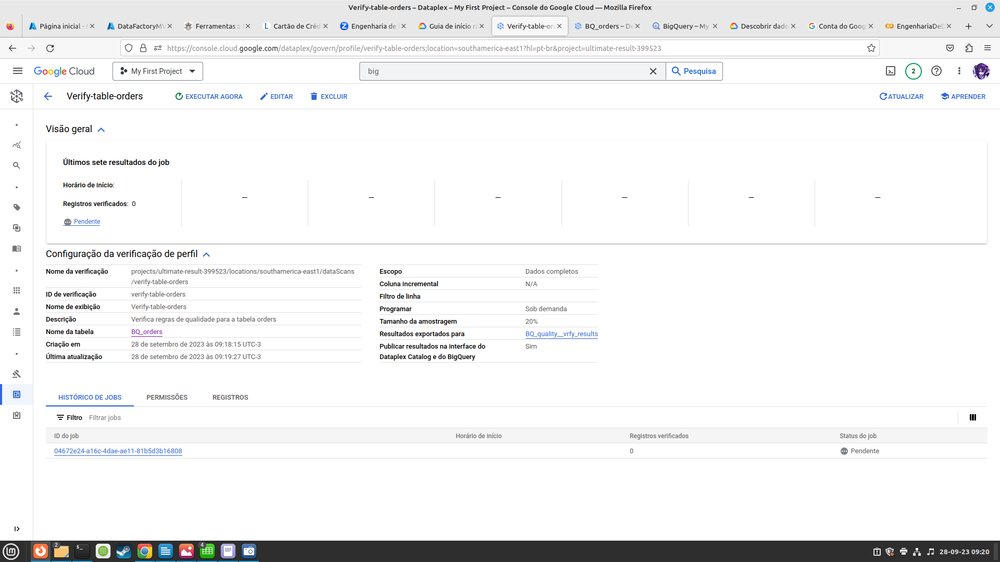

Verificamos então que é através do perfil que o Dataplex irá obter as informações sobre quais os tipos de dados envolvidos, qual a comprimento mínimo e máximo dos dados, e várias outras estatístivas relativas aos dados, como por exemplo a "moda" de um termo (o percentual de vezes que cada termo se repete dentro da mesma coluna). Dessa forma, consegue-se eleger regras de qualidade baseadas nos próprios dados já presentes no banco de dados.

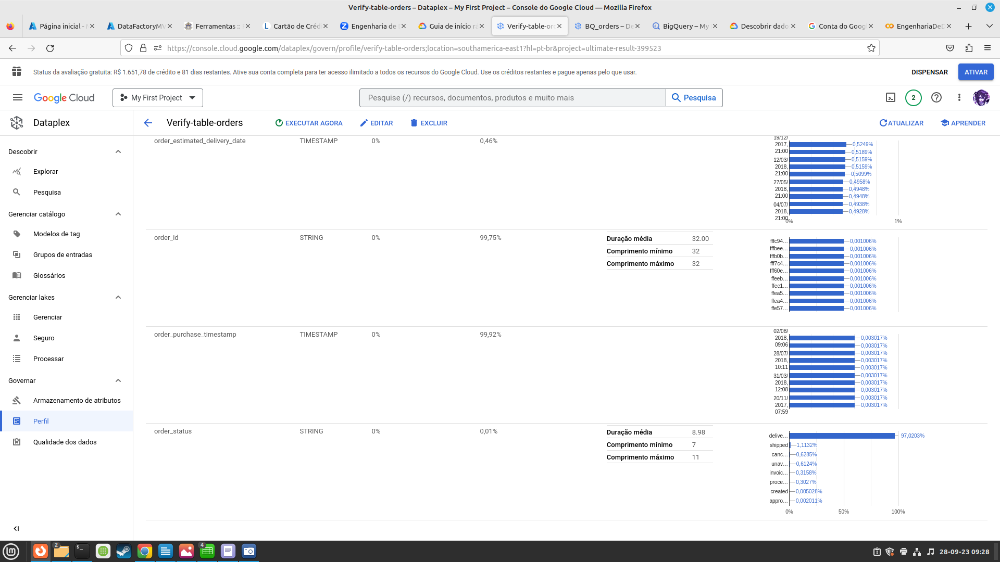

**5.1.3 Criar verificações de qualidade de dados**

Após a criação do perfil, é necessário criar sa verificações de qualidade. Vamos fazer três verificações de qualidade.

**5.1.3.1 Verificação derivada do perfil:**

Na nossa primeira verificação, importamos a recomendação do perfil para o campo order_status. Porém, vamos editar esta recomendação, de forma a considerar que o valor "NULL" para este campo representa uma má qualidade de dado. Vamos então remover a porção em vermelho da imagem abaixo visando aferir a qualidade do campo desta nova forma:

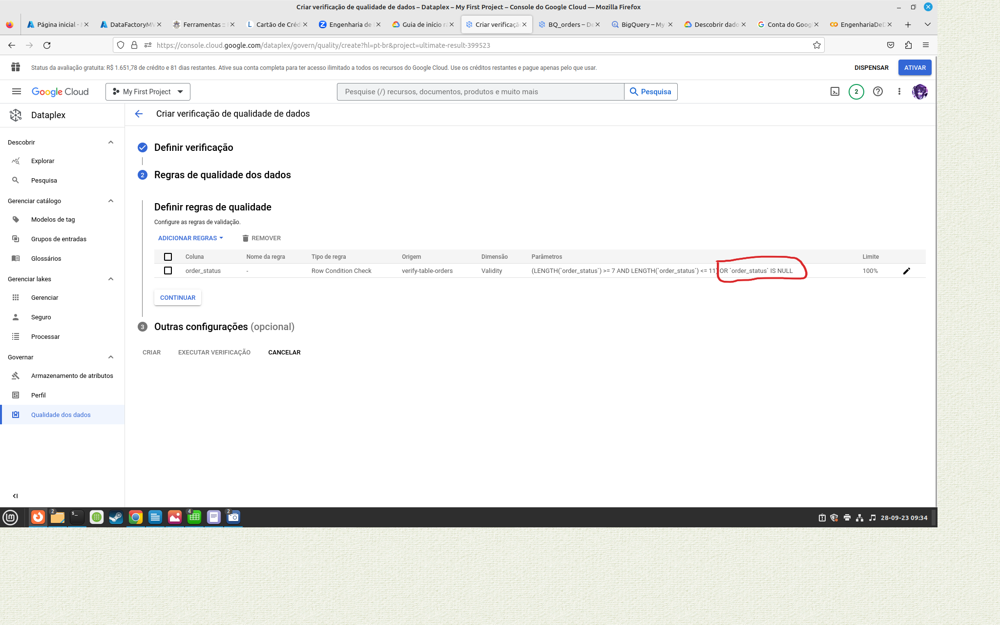

Editamos os parâmetros para remover a possibilidade de valores NULL da regra de verificação de qualidade, e mantivemos como está na imagem abaixo:

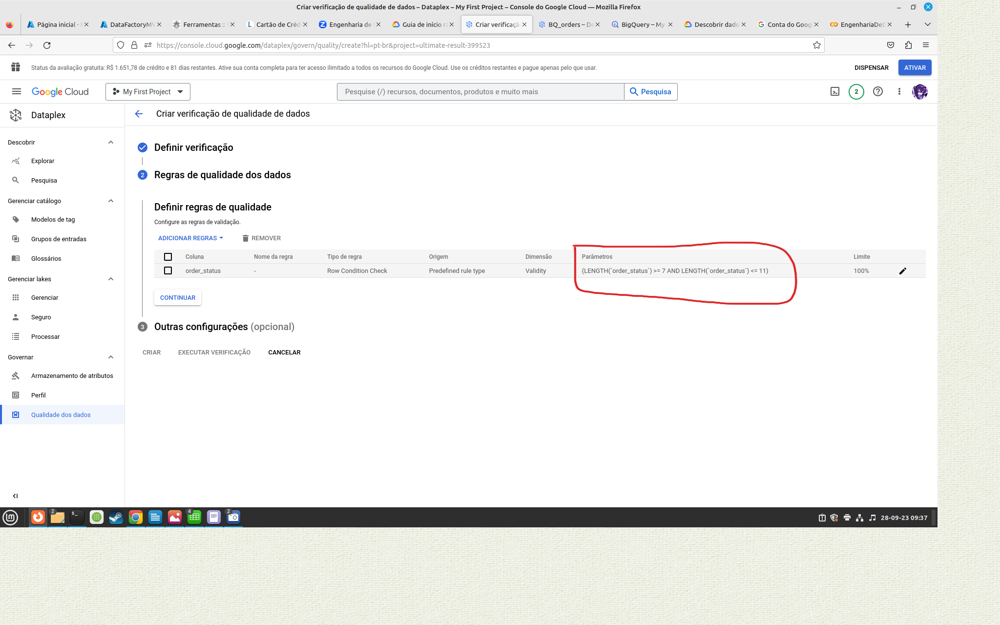

A verificação envolve a geração de uma tabela do BigQuery, que denominamos de **BQ-vrfy-quality-orders**, conforme abaixo:

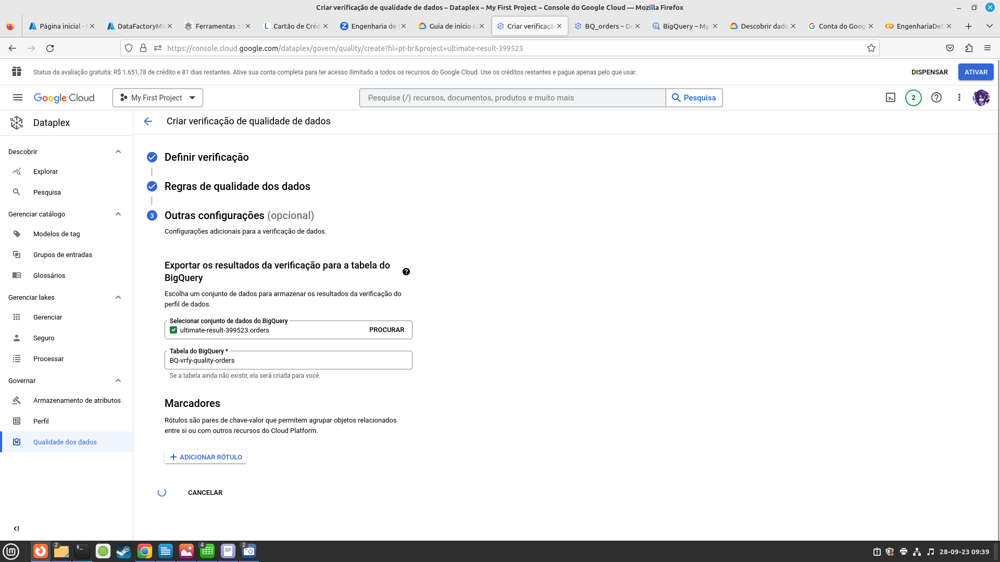

**Escopo da verificação:** Amostragem 20%

**Tabela:** orders

**Regra:** LENGTH(order_status) > 7 and LENGTH(order_status) < 11 (regra obtida via perfil)

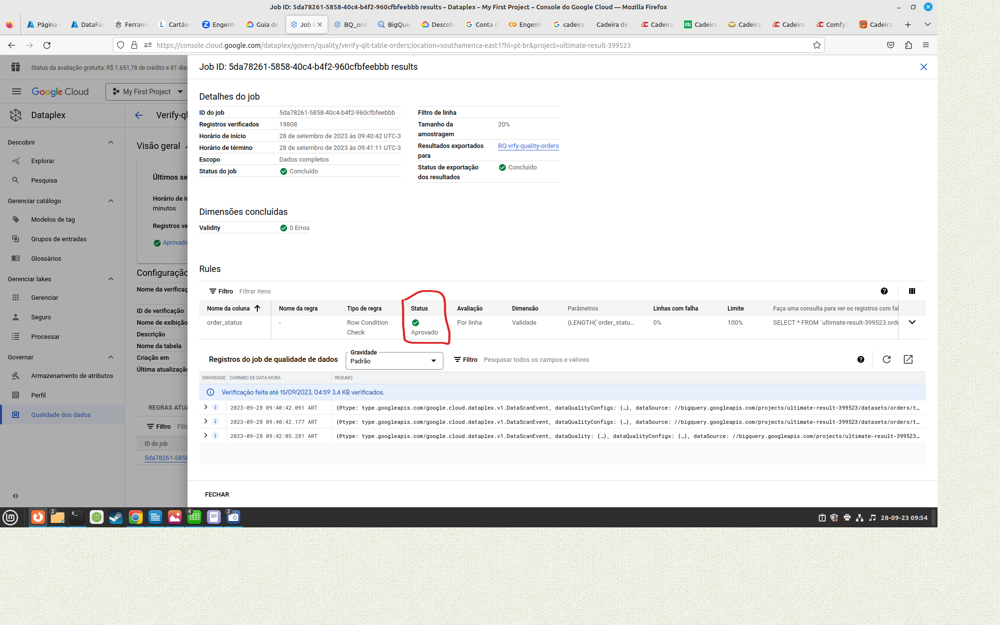

**RESULTADO:** Nesta verificação, feita numa amostra de 20% dos dados, não foram encontrados dados que não atendam as condições analisadas. Ou seja, no campo order_status não há dados fora do lenght esperado e não há dados nulos.

**5.1.3.2 Verificação baseada em regra de negócio: data de entrega vazia (null)**

Uma segunda verificação de qualidade possível seria a seguinte: **Existe alguma venda com status "delivered" e que não tenha a data de entrega preenchida?** Vamos escrever a regra para conseguirmos verificar se este caso existe. Caso exista, ele estará diminuindo a qualidade dos nossos dados.

**Escopo da verificação:** Todos os dados

**Tabela:** orders

**Regra:** order_status = 'delivered' AND order_delivered_customer_date is not null

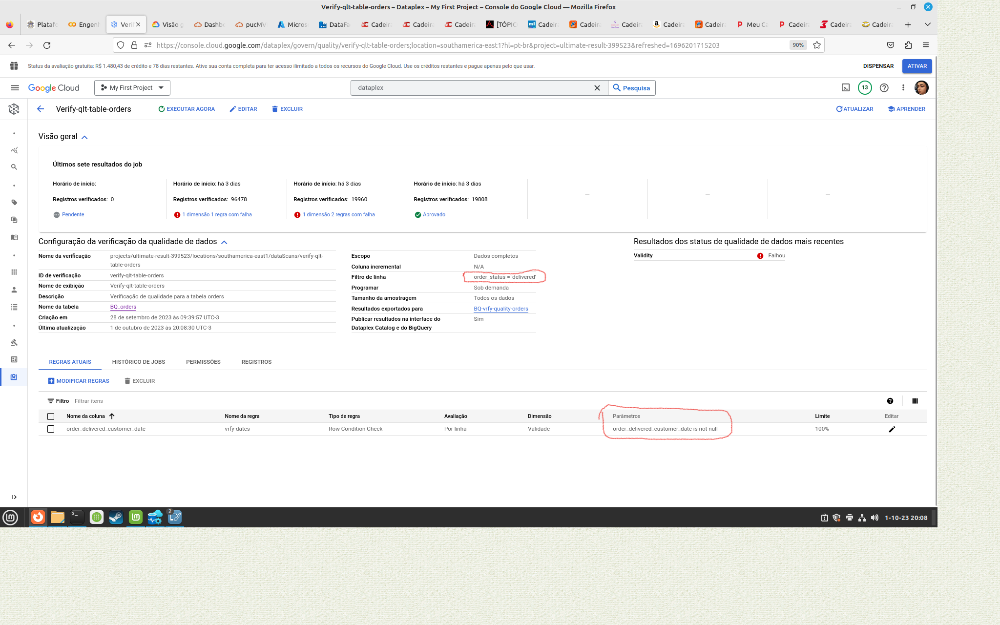

Fizemos a mesma conferência da regra de qualidade nos baseando numa query, para saber se existem registros sem qualidade na base de dados, conforme abaixo:

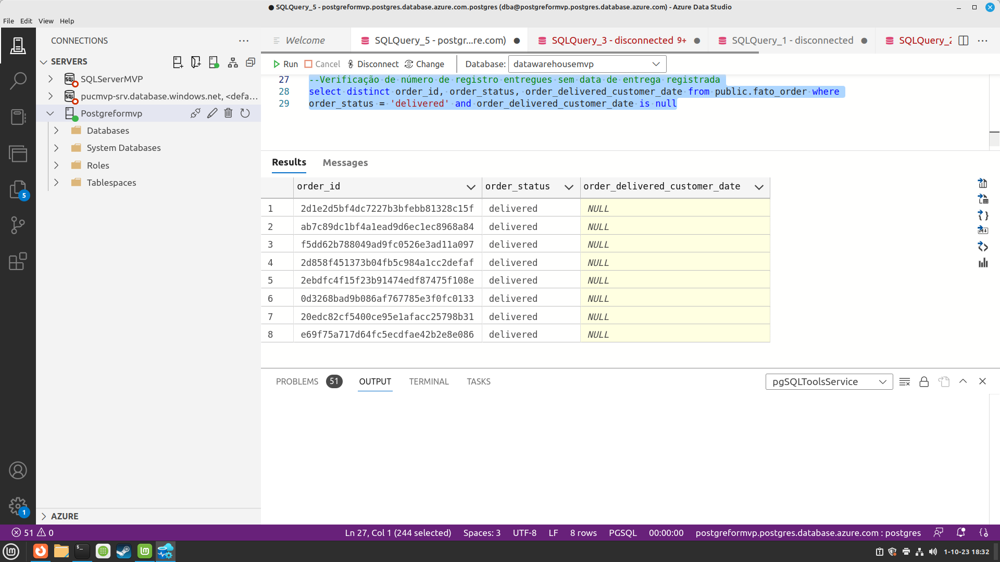

**Resultado:** Existem apenas 8 registros (+- 0,01%) nessa condição inválida. Como a nossa regra exige que 100% dos registros atendam a condição, a análise de qualidade de dados é mostrada como **falhada**, conforme o print abaixo:

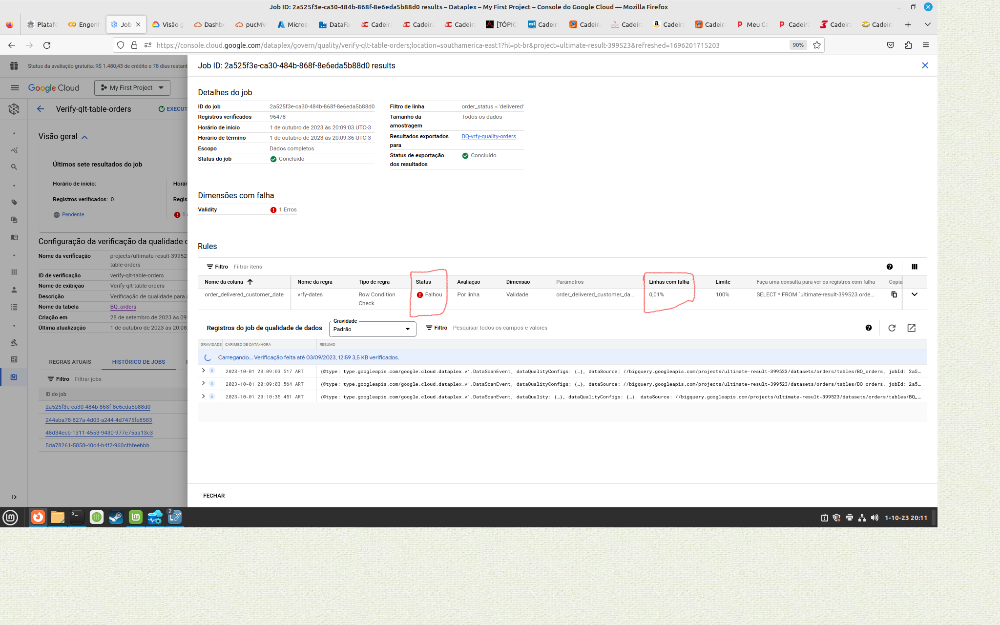

**5.1.3.3 Verificação baseada em regra de negócio: boleto com mais de uma parcela**

Digamos que em nossa regra de negócio, boletos sejam meios de pagamento exclusivos, e não podem ser misturados com outros métodos de pagamento.

Poderíamos então gerar uma regra de qualidade para verificar se algum dos pagamentos por boleto tem o número sequencial maior que 1. Caso haja, pode ser considerado um problema de qualidade dos dados.

Vamos então gerar a regra:

**Escopo da verificação:** Todos os dados

**Tabela:** payments

**Regra:** payment_type = 'boleto' AND payment_sequential = 1

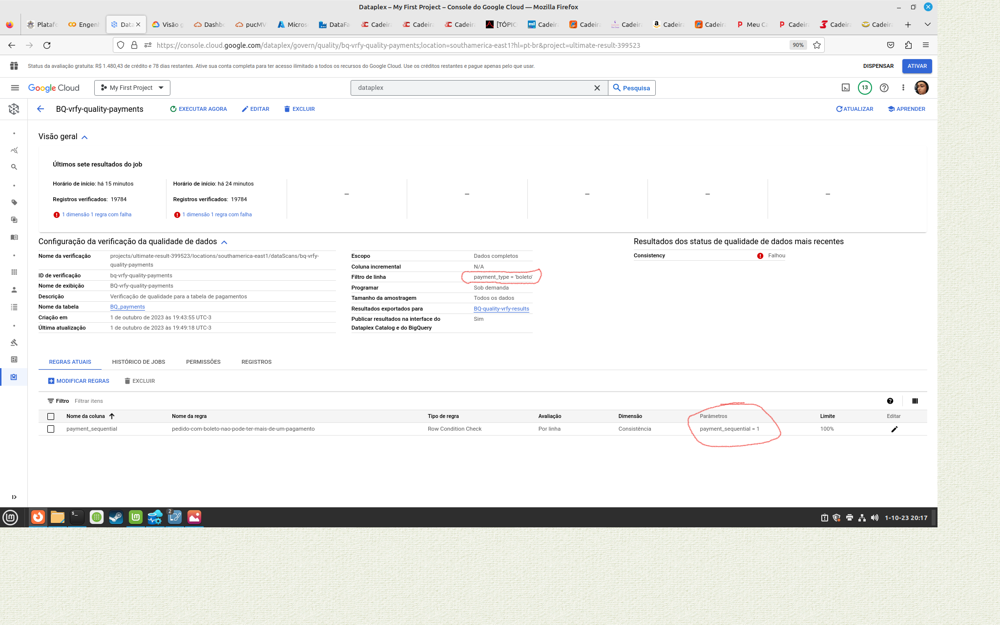

**Resultado:** Existe apena 1 registro (+- 0,01%) nessa condição inválida. Como a nossa regra exige que 100% dos registros atendam a condição, a análise de qualidade de dados é mostrada como **falhada**, conforme o print abaixo:

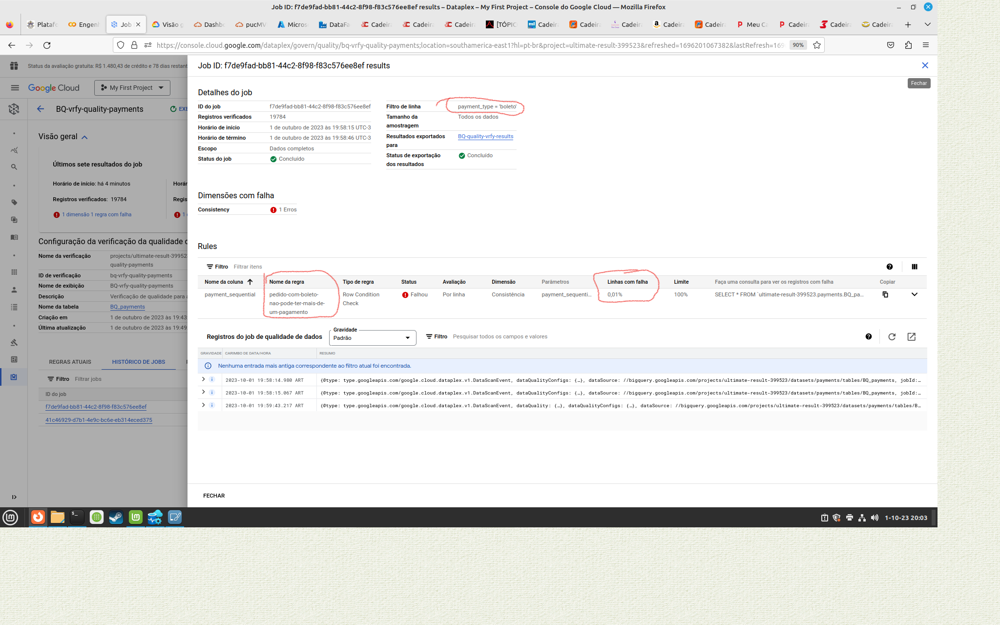



> **5.2 Solução dos problemas elencados**



- **PERGUNTA:** Qual o incremento de vendas de produtos de um ano para o outro?


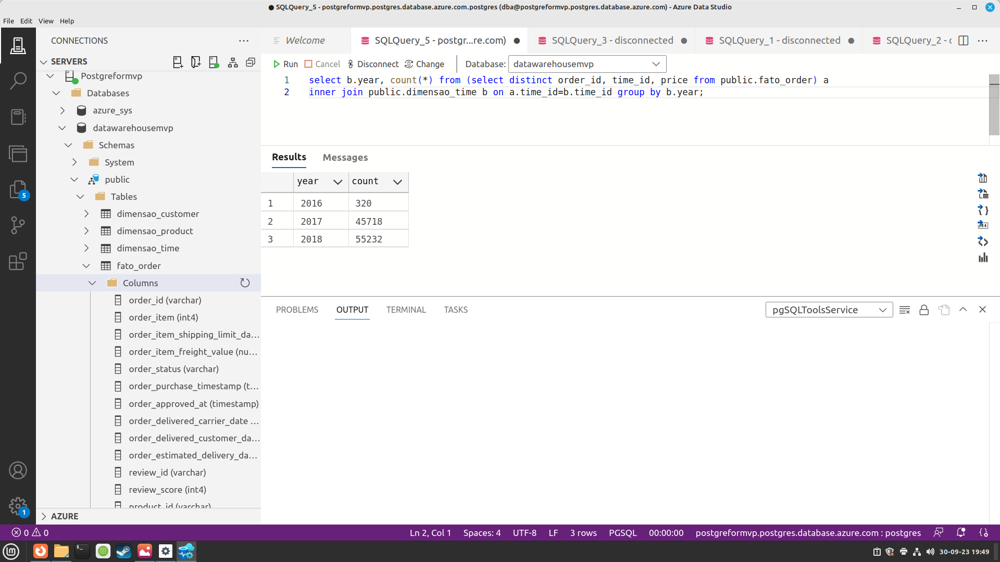

>>**Análise:** Conseguimos através desta primeira query notar um desbalanceamento da base de dados no contexto histórico. O ano de 2016 contém um pequeno registro de vendas (320), enquanto os anos de 2017 e 2018 contém um número muito maior de registros(45718 e 55232). Dessa forma, as análises dos dados relativos a 2016 não devem nos trazer dados confiáveis quando feito comparativos com os outros anos, mas mesmo assim continuaremos fazendo o comparativo nas próximas perguntas.


- **PERGUNTA:** Quais os produtos que mais venderam nos últimos anos?

>>Infelizmente nossa base de dados não possui o campo "product_name". Podemos obter no máximo o "product_id" do produto que mais vendeu. Para isto precisaremos utilizar uma função analítica dos bancos de dados para realizar ranqueamento (RANK OVER), conforme abaixo:

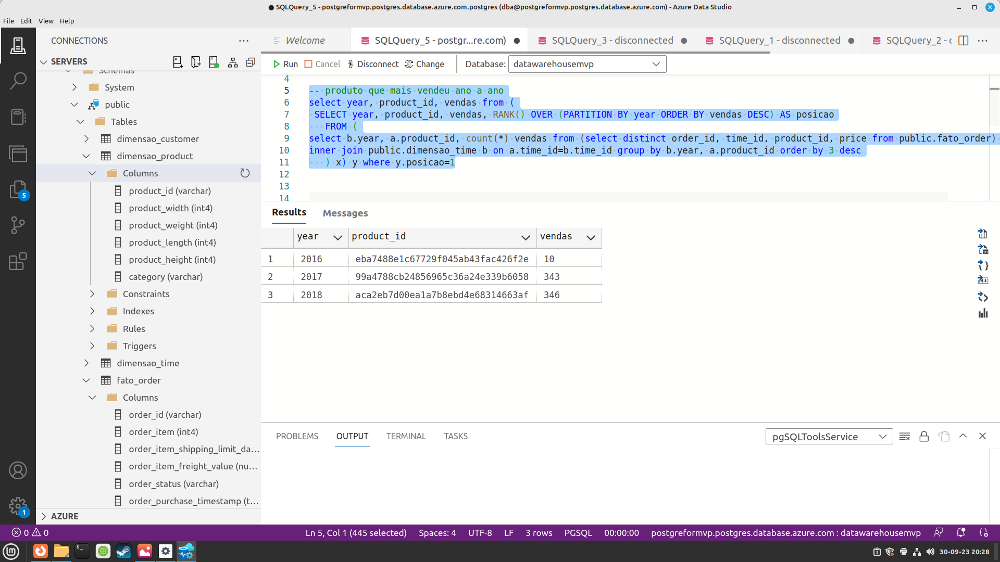

>>**Análise:** Podemos então ver que o produto que mais vendeu em 2016 foi o de ID "eba7488e1c67729f045ab43fac426f2e", enquanto o que mais vendeu em 2017 foi o de ID "99a4788cb24856965c36a24e339b6058", e o que mais vendeu em 2018 foi o de ID "aca2eb7d00ea1a7b8ebd4e68314663af".

- **PERGUNTA:** Quais as três categorias de produtos que mais venderam nos últimos anos?

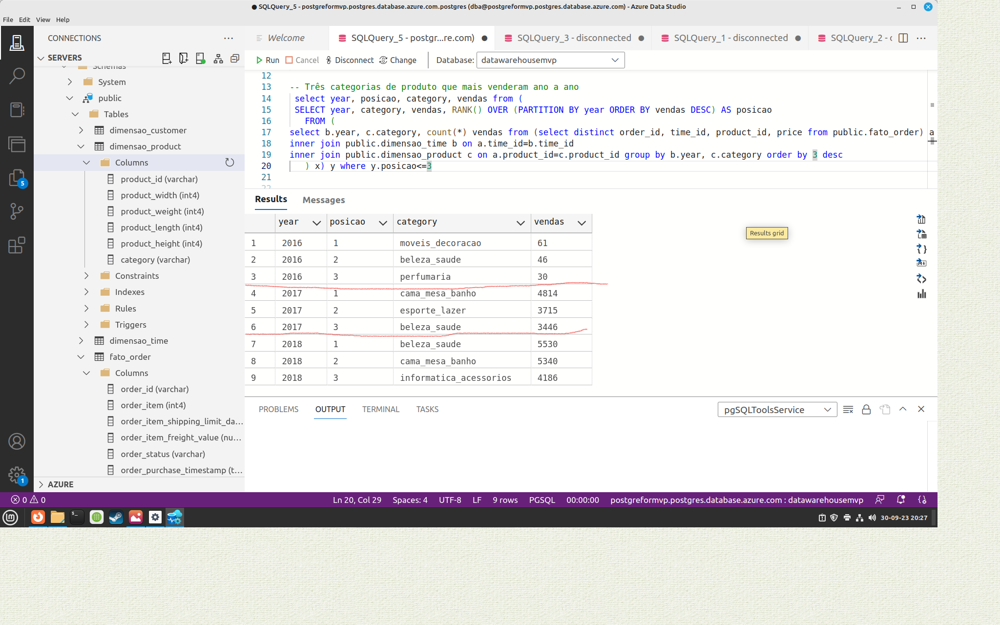

>>**Análise:** Podemos notar que "moveis e decoracao" foi o items mais vendido em 2016, enquanto "cama mesa e banho" foi o mais vendido em 2017, e já em 2018 o item "beleza e saúde" foi o primeiro lugar.

- **PERGUNTA:** Quais os métodos de pagamentos mais usados por consumidores jovens(<30)? E quais os métodos de pagamentos mais usados por consumidores idosos (>65)? E quais os métodos de pagamentos mais usados pelos consumidores em geral?

>> Não conseguiremos computar quais os métodos de pagamentos mais usados por jovens e idosos devido a limitação de nossa base de dados. Ela não possui na tabela "customer" os campos de "idade" e nem de "data de nascimento". Mas conseguiremos saber os métodos de pagamentos mais usados pelo público em geral, conforme mostrado abaixo:


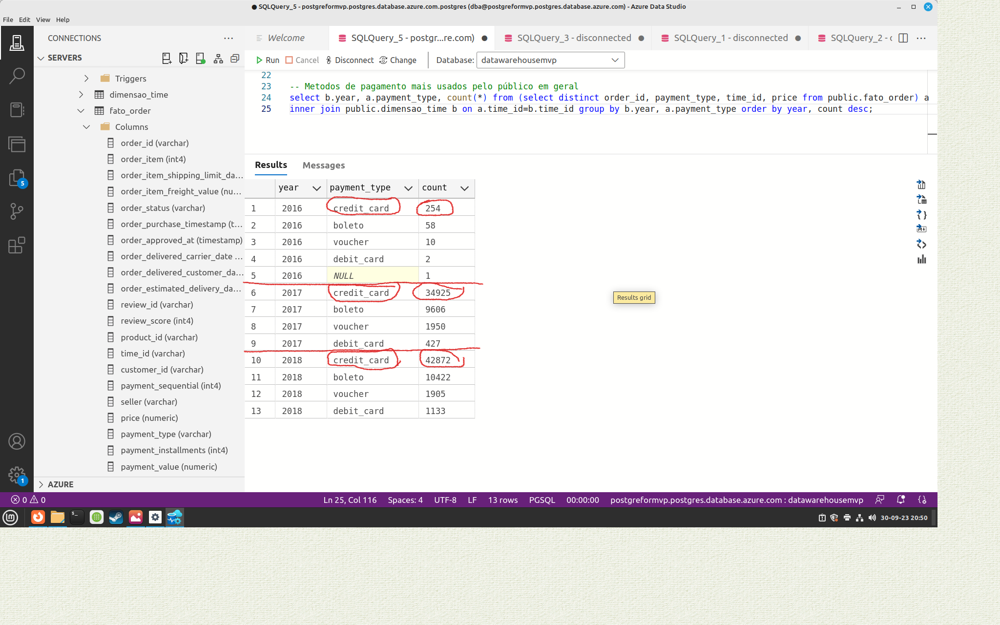

>>**Análise**: A query executada acima deixa claro que o cartão de crédito é, sem sombra de dúvida, o meio de pagamento mais utilizado pelos consumidores presentes nesta base de dados.

* **PERGUNTA:** Qual o índice de satisfação médio do consumidor do Nordeste do Brasil? E qual o índice de satisfação médio do consumidor do Sul do Brasil? E qual o índice GERAL de todos os consumidores?

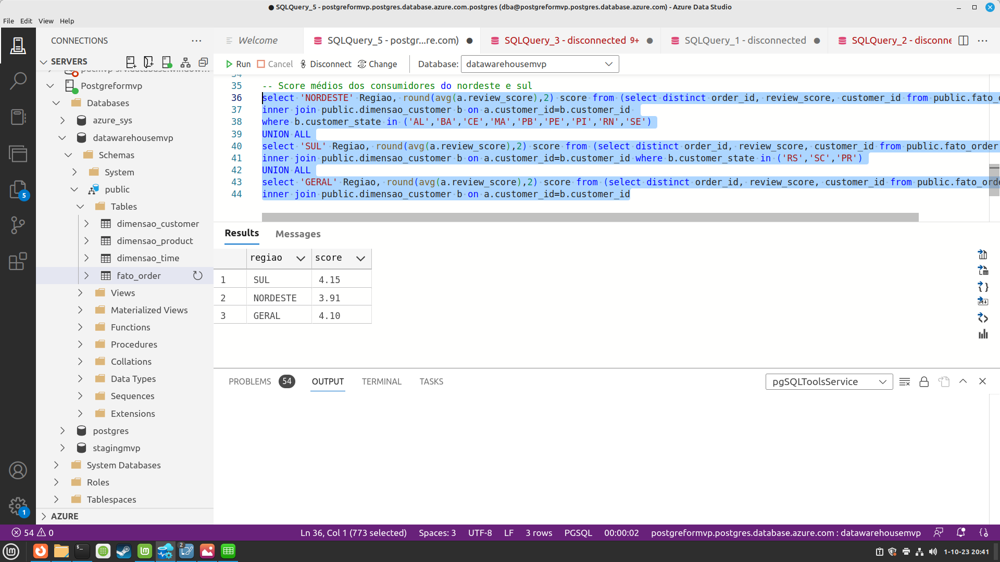

>> **ANÁLISE:** Resolvemos usar como índice de satisfação o campo review_score, que é a nota dada pelo consumidor a cada avaliação feita. Por este campo, calculamos a média de todas as vendas existentes em nossa base de dados. Dessa forma obtivemos um score médio de **4,15** para as avaliações de vendas para consumidores do SUL, **3,91** para as avaliações de venda dos consumidores do nordeste e **4,1** para todas as avaliações de vendas de todos os consumidores.



